In [2]:
import copy
import math
import os
import sys
sys.path.append('../src/')
import warnings
warnings.filterwarnings('ignore')

from hydra.experimental import initialize, initialize_config_module, initialize_config_dir, compose
from IPython.display import display
from omegaconf import OmegaConf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score
import timm
import torch
import torchvision
from torchvision.utils import make_grid
from torchvision.io.image import read_image
from torchvision.transforms.functional import normalize, resize, to_pil_image
from torchvision.models import resnet18
from tqdm import tqdm
from torchcam.cams import SmoothGradCAMpp
from torchcam.utils import overlay_mask

import custom
from kvt.builder import (
        build_callbacks,
        build_dataloaders,
        build_hooks,
        build_lightning_module,
        build_logger,
        build_loss,
        build_model,
        build_optimizer,
        build_scheduler,
        build_metrics,
)
import kvt.utils
from kvt.initialization import initialize as kvt_initialize

kvt_initialize()

In [4]:
# backbone = resnet18(pretrained=True)
backbone = timm.create_model('tf_efficientnet_b0_ns', pretrained=True)

In [5]:
model = kvt.MODELS.get('G2Net')(backbone)
model.eval();

CQT kernels created, time used = 0.0100 seconds


In [6]:
SmoothGradCAMpp(backbone).target_layer

'blocks.0.0.act1'

In [7]:
backbone

EfficientNet(
  (conv_stem): Conv2dSame(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
  (bn1): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (act1): SiLU(inplace=True)
  (blocks): Sequential(
    (0): Sequential(
      (0): DepthwiseSeparableConv(
        (conv_dw): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
        (bn1): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        (act1): SiLU(inplace=True)
        (se): SqueezeExcite(
          (conv_reduce): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
          (act1): SiLU(inplace=True)
          (conv_expand): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
          (gate): Sigmoid()
        )
        (conv_pw): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn2): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        (act2): Identity()
      )
    )
 

In [13]:
target_layer = 'backbone.layer4'
cam_extractor = SmoothGradCAMpp(model, input_shape=(3, 4096), target_layer=target_layer)

In [108]:
x = np.load('../data/input/train/0/0/0/00000e74ad.npy').astype('float32')
# x = (x - 4.3110074e-26) / 6.1481726e-21
x = x / x.max()
inputs = torch.tensor(x).unsqueeze(0)

In [109]:
out = model(inputs)
activation_map = cam_extractor(out.squeeze(0).argmax().item(), out)

In [110]:
images = model(inputs, return_spectrogram=True)[0]

In [111]:
images.shape

torch.Size([3, 54, 129])

In [112]:
images.mean()

tensor(0.2175)

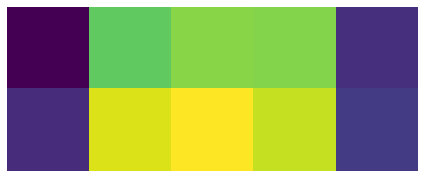

In [113]:
plt.imshow(activation_map.numpy()); plt.axis('off'); plt.tight_layout(); plt.show()

In [114]:
images = images.numpy().transpose(1, 2, 0)

In [128]:
images = (255 * (images - images.min()) / images.max()).astype('uint8')

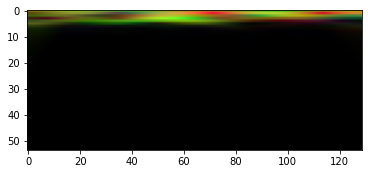

In [129]:
plt.imshow(images)

In [130]:
overlay_cam = overlay_mask(to_pil_image(images), to_pil_image(activation_map, mode='F'), alpha=0.5)
original_inputs = to_pil_image(images)
to_show = get_concat_h(original_inputs, overlay_cam)

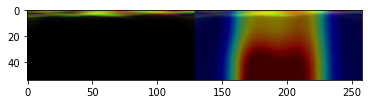

In [131]:
plt.imshow(to_show)

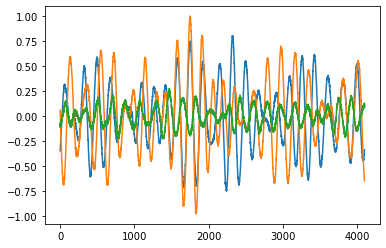

In [132]:
plt.plot(x.T)

In [3]:
img1 = read_image("../data/input/photos/0009e50b94be36ccad39.jpg")
img1 = resize(img1, (224, 224)) / 255.
img2 = read_image("../data/input/photos/246c09924d1708cca45d.jpg")
img2 = resize(img2, (224, 224)) / 255.

# img = torch.cat([img1.unsqueeze(0), img2.unsqueeze(0)], dim=0)

In [4]:
inputs, maps = [], []

for img in ([img1, img2] * 8):
    input_tensor = normalize(img1, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    out = model(input_tensor.unsqueeze(0))
    activation_map = cam_extractor(out.squeeze(0).argmax().item(), out)
    inputs.append(img)
    maps.append(activation_map)

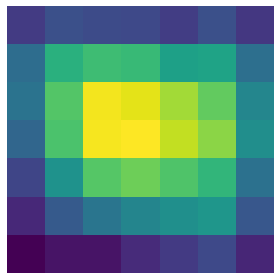

In [5]:
plt.imshow(maps[0].numpy()); plt.axis('off'); plt.tight_layout(); plt.show()

In [29]:
from PIL import Image

def get_concat_h(im1, im2):
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

In [19]:
num_images = 16
n_cols = int(math.ceil(math.sqrt(num_images / 2)))
n_rows = int(math.ceil(num_images / n_cols))

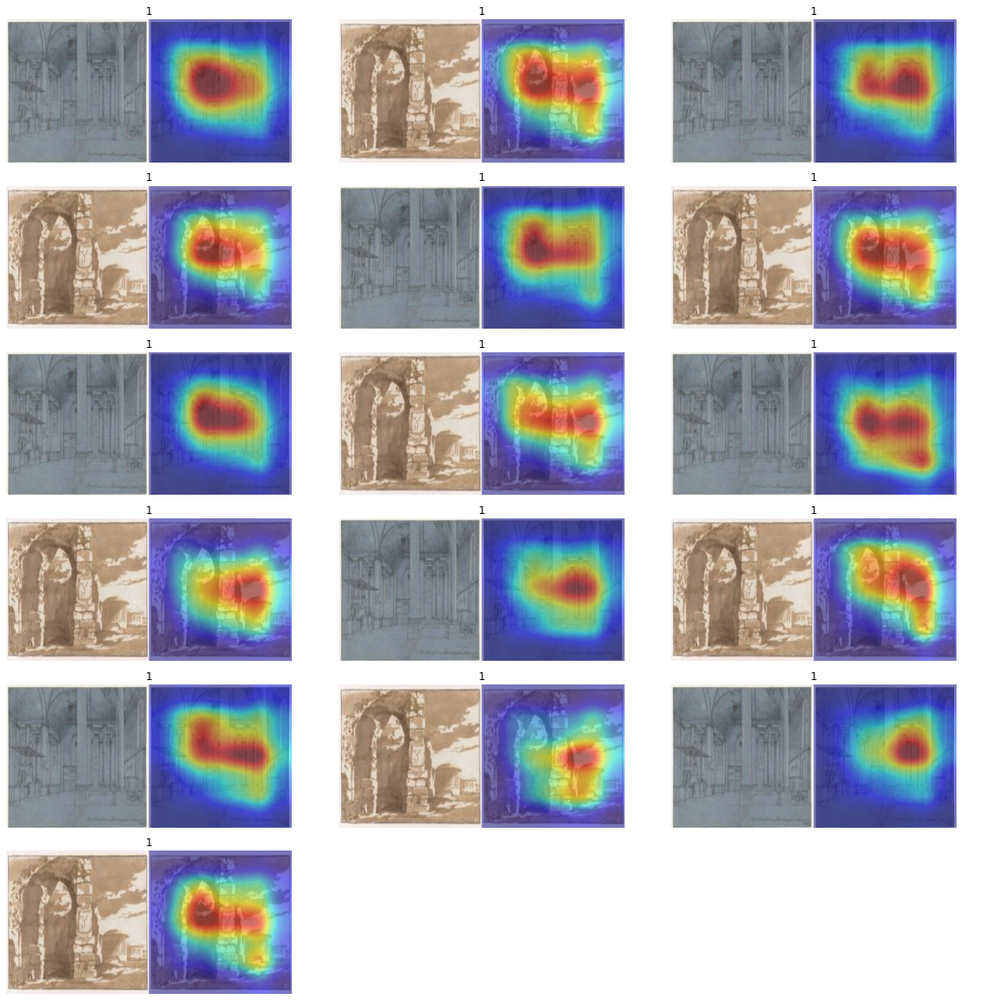

In [24]:
fig, axes= plt.subplots(n_rows, n_cols, figsize=(16, 16), tight_layout=True)

for i in range(n_rows*n_cols):
    if i < num_images:
        overlay_cam = overlay_mask(to_pil_image(inputs[i]), to_pil_image(maps[i], mode='F'), alpha=0.5)
        original_inputs = to_pil_image(inputs[i])
        to_show = get_concat_h(original_inputs, overlay_cam)
        axes[i//n_cols][i%n_cols].imshow(to_show)
        axes[i//n_cols][i%n_cols].set_title(f'{1}')
        
    axes[i//n_cols][i%n_cols].axis('off')
plt.show()

In [16]:
cam = GradCAM(model=model, target_layer=target_layer, use_cuda=True)

# You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
grayscale_cam = cam(input_tensor=input_tensor)

In [17]:
grayscale_cam.shape

(2, 224, 224)

In [40]:
gcam = grayscale_cam[1]

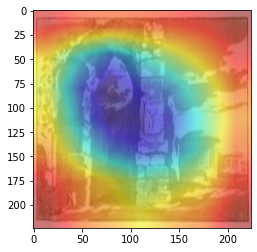

In [41]:
visualization = show_cam_on_image(img2.numpy().transpose(1, 2, 0), gcam)
plt.imshow(visualization)

In [5]:
with initialize(config_path='../config/'):
    config = compose(
        overrides=[
#             '+trainer=exp002', 
#             '+augmentation=exp001', 
#             '+dataset=default_dataset', 
            '+env=default_env',
        ]
    )
    # replace for notebook
#     config.dataset.dataset.params.data_dir = '../data/input'
#     config.trainer.evaluation.dirpath = '../data/output/predictions/oof'
#     config.trainer.evaluation.batch_size = batch_size

In [6]:
# build hooks
hooks = build_hooks(config)

# build model
model = build_model(config)

# build datasets
dataloaders = build_dataloaders(config)

Loaded object file: ../src/kvt/hooks/post_forward_hook.py
Loaded object file: ../src/kvt/hooks/model_builder_hook.py
Loaded object file: /opt/conda/lib/python3.7/site-packages/timm/models/resnet.py
---------------------------------------------------------------
dataset config: 
 {'name': 'RANZCRDataset', 'params': {'data_dir': '../data/input', 'csv_filename': 'preprocessed_train.csv', 'image_column': 'StudyInstanceUID', 'target_column': ['ETT - Abnormal', 'ETT - Borderline', 'ETT - Normal', 'NGT - Abnormal', 'NGT - Borderline', 'NGT - Incompletely Imaged', 'NGT - Normal', 'CVC - Abnormal', 'CVC - Borderline', 'CVC - Normal', 'Swan Ganz Catheter Present'], 'num_fold': 5, 'idx_fold': 0, 'mode': 'train', 'split': 'train'}}
Loaded object file: ../src/custom/transforms/ranzcr_transform.py
[ranzcr_transform] resize_to: (768, 768)
[ranzcr_transform] tta: 1
Loaded object file: ../src/custom/datasets/ranzcr.py
---------------------------------------------------------------
dataset config: 
 {'n

In [7]:
def score(y_true, y_pred, columns):
    result = {}
    for i, c in enumerate(columns):
        result[c] = roc_auc_score(y_true[:, i], y_pred[:, i])
    return result

In [8]:
class InverseNormalize(torchvision.transforms.Normalize):
    def __init__(self, mean, std):
        mean = torch.as_tensor(mean)
        std = torch.as_tensor(std)
        std_inv = 1 / (std + 1e-7)
        mean_inv = -mean * std_inv
        super().__init__(mean=mean_inv, std=std_inv)

    def __call__(self, tensor):
        return super().__call__(tensor.clone())
    
inv_norm = InverseNormalize(mean=[0.86821552, 0.73319595, 0.81884091], std=[0.37468367, 0.5095725, 0.4131941])

In [9]:
# load best checkpoint
state_dict = torch.load(best_model_path)['state_dict']

# if using dp, it is necessary to fix state dict keys
if len(config.trainer.trainer.gpus)>=2:
    state_dict = kvt.utils.fix_dp_model_state_dict(state_dict)
    
model.load_state_dict(state_dict)
model.cuda()
model.eval();

In [10]:
# Grad-CAM
target_layer = model.layer4
grad_cam = GradCAMpp(model, target_layer)

In [11]:
valid_dataloader = [d for d in dataloaders if d['split']=='validation'][0]['dataloader']
y_true = valid_dataloader.dataset.df_examples[valid_dataloader.dataset.target_column]

In [12]:
# load oof
path = os.path.join(
    config.trainer.evaluation.dirpath,
    f'{split}_{config.trainer.evaluation.name}'
)
y_pred = np.load(path)
y_pred = pd.DataFrame(y_pred, columns=valid_dataloader.dataset.target_column)

In [13]:
diff = pd.DataFrame((y_true.values - y_pred.values) ** 2, columns=valid_dataloader.dataset.target_column)
diff['mean'] = diff.mean(axis=1)
diff['rank'] = diff['mean'].rank(ascending=False)

In [14]:
score(y_true.values, y_pred.values, valid_dataloader.dataset.target_column)

{'ETT - Abnormal': 0.9930347013680347,
 'ETT - Borderline': 0.958665113681983,
 'ETT - Normal': 0.9901156200270795,
 'NGT - Abnormal': 0.9606027160612313,
 'NGT - Borderline': 0.9496567725111213,
 'NGT - Incompletely Imaged': 0.9843536999735498,
 'NGT - Normal': 0.9840932343234323,
 'CVC - Abnormal': 0.917932594012533,
 'CVC - Borderline': 0.85494095583171,
 'CVC - Normal': 0.9119957540720934,
 'Swan Ganz Catheter Present': 0.9932419616865821}

In [42]:
def calculate_gradcam(grad_cam, valid_dataloader, index):
    valid_dataloader = copy.deepcopy(valid_dataloader)
    valid_dataloader.dataset.df_examples = valid_dataloader.dataset.df_examples.iloc[index]        
    valid_dataloader.dataset.image_ids = valid_dataloader.dataset.image_ids.iloc[index]        
    
    results = []
    for i, data in enumerate(valid_dataloader):
        x, y = data['x'].cuda(), data['y'].cuda()
        mask, _ = grad_cam(x)
        inv_x = inv_norm(x)
        heatmap, result = visualize_cam(mask, inv_x)
        results.extend([inv_x.cpu().squeeze(), result, heatmap])
    return results


def plot_gradcam(grad_cam, valid_dataloader, index, y_true, y_pred):
    images = calculate_gradcam(grad_cam, valid_dataloader, index)
    for i, ind in enumerate(index):
        l = pd.DataFrame([y_true.iloc[ind], y_pred.iloc[ind]])
        l.index = ['true', 'pred']
        print('-'*150)
        display(l)
        grid_images = make_grid(images[i*3:(i+1)*3], nrow=3)
        display(torchvision.transforms.ToPILImage()(grid_images))

## 上手く行っているもの

------------------------------------------------------------------------------------------------------------------------------------------------------


,ETT - Abnormal,ETT - Borderline,ETT - Normal,NGT - Abnormal,NGT - Borderline,NGT - Incompletely Imaged,NGT - Normal,CVC - Abnormal,CVC - Borderline,CVC - Normal,Swan Ganz Catheter Present
true,0.000000e+00,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000e+00
pred,4.596006e-09,1.770592e-07,0.00011,0.000003,0.000002,0.000002,0.000142,0.999997,0.000747,0.000158,2.821023e-08


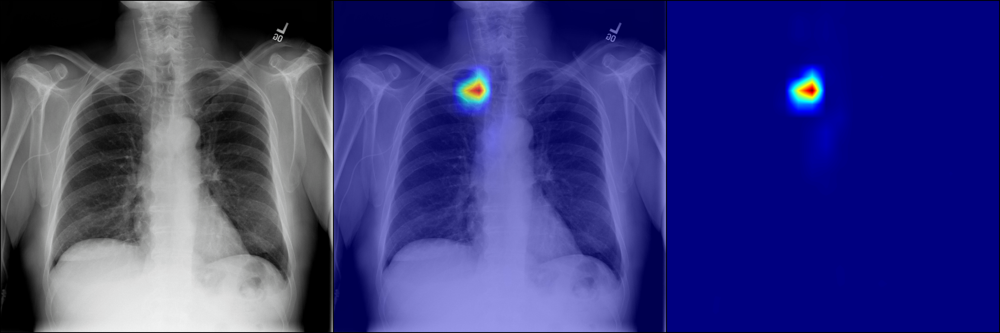

------------------------------------------------------------------------------------------------------------------------------------------------------


,ETT - Abnormal,ETT - Borderline,ETT - Normal,NGT - Abnormal,NGT - Borderline,NGT - Incompletely Imaged,NGT - Normal,CVC - Abnormal,CVC - Borderline,CVC - Normal,Swan Ganz Catheter Present
true,0.000000e+00,0.000000e+00,0.000000,0.00000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000e+00
pred,2.765373e-08,4.275596e-07,0.000246,0.00002,0.000011,0.000004,0.000182,0.999995,0.001376,0.000244,5.421426e-08


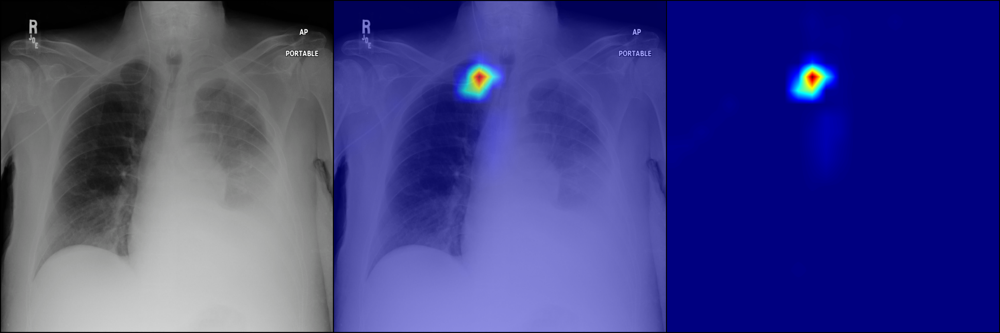

------------------------------------------------------------------------------------------------------------------------------------------------------


,ETT - Abnormal,ETT - Borderline,ETT - Normal,NGT - Abnormal,NGT - Borderline,NGT - Incompletely Imaged,NGT - Normal,CVC - Abnormal,CVC - Borderline,CVC - Normal,Swan Ganz Catheter Present
true,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000e+00
pred,1.074422e-07,1.147582e-07,0.000398,0.000003,9.814955e-07,0.000027,0.000005,0.999973,0.002072,0.000961,1.091305e-07


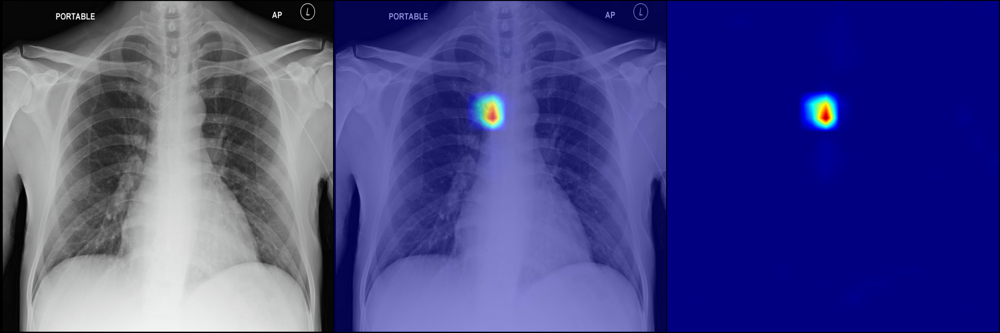

------------------------------------------------------------------------------------------------------------------------------------------------------


,ETT - Abnormal,ETT - Borderline,ETT - Normal,NGT - Abnormal,NGT - Borderline,NGT - Incompletely Imaged,NGT - Normal,CVC - Abnormal,CVC - Borderline,CVC - Normal,Swan Ganz Catheter Present
true,0.000000e+00,0.000000e+00,0.00000,0.000000,0.000000e+00,0.000000,0.000000,1.000000,0.00000,0.000000,0.000000e+00
pred,1.844025e-07,2.190793e-07,0.00041,0.000013,4.326438e-07,0.000025,0.000002,0.999988,0.00062,0.000574,9.229211e-08


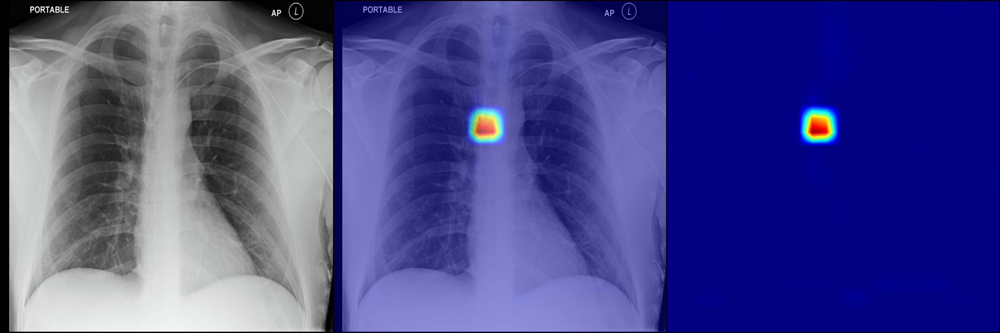

------------------------------------------------------------------------------------------------------------------------------------------------------


,ETT - Abnormal,ETT - Borderline,ETT - Normal,NGT - Abnormal,NGT - Borderline,NGT - Incompletely Imaged,NGT - Normal,CVC - Abnormal,CVC - Borderline,CVC - Normal,Swan Ganz Catheter Present
true,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000e+00
pred,1.095687e-07,1.926150e-07,0.000311,0.000086,0.000002,0.000163,0.000008,0.999996,0.000912,0.000194,7.903263e-08


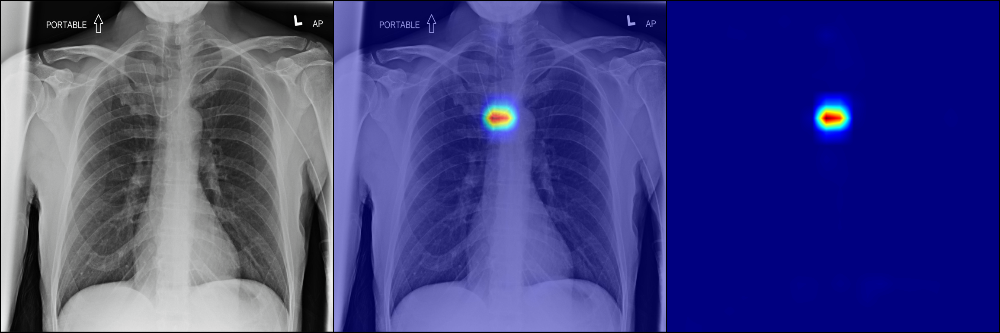

In [43]:
idx = diff[diff['rank']>len(diff)-5].index
plot_gradcam(grad_cam, valid_dataloader, idx, y_true, y_pred)

## 失敗しているもの

------------------------------------------------------------------------------------------------------------------------------------------------------


,ETT - Abnormal,ETT - Borderline,ETT - Normal,NGT - Abnormal,NGT - Borderline,NGT - Incompletely Imaged,NGT - Normal,CVC - Abnormal,CVC - Borderline,CVC - Normal,Swan Ganz Catheter Present
true,0.00000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
pred,0.00004,0.008355,0.976717,0.000057,0.000633,0.873725,0.053543,0.005651,0.356923,0.973632,0.000136


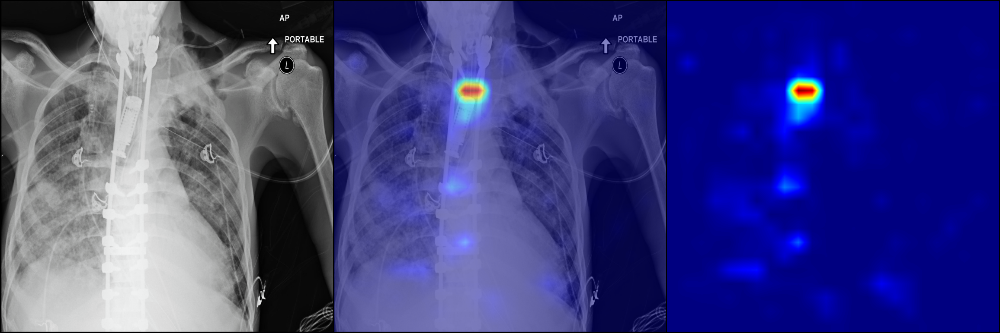

------------------------------------------------------------------------------------------------------------------------------------------------------


,ETT - Abnormal,ETT - Borderline,ETT - Normal,NGT - Abnormal,NGT - Borderline,NGT - Incompletely Imaged,NGT - Normal,CVC - Abnormal,CVC - Borderline,CVC - Normal,Swan Ganz Catheter Present
true,0.000000,0.000000,0.00000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,0.000000
pred,0.000046,0.018711,0.95408,0.022756,0.059822,0.763652,0.066015,0.004554,0.989808,0.04039,0.000007


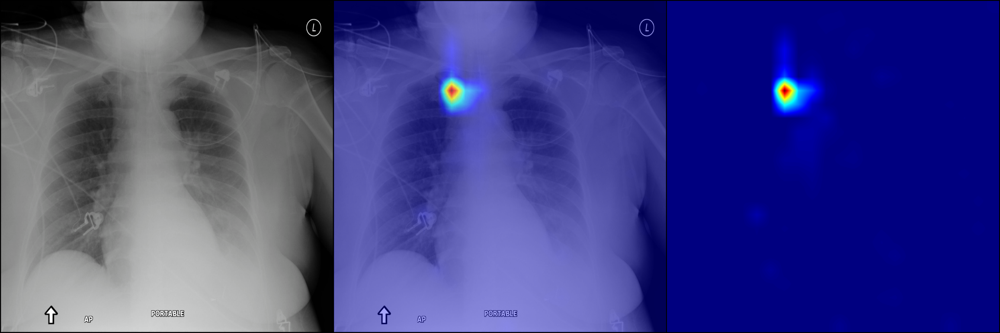

------------------------------------------------------------------------------------------------------------------------------------------------------


,ETT - Abnormal,ETT - Borderline,ETT - Normal,NGT - Abnormal,NGT - Borderline,NGT - Incompletely Imaged,NGT - Normal,CVC - Abnormal,CVC - Borderline,CVC - Normal,Swan Ganz Catheter Present
true,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.00000,0.000000,0.000000,0.00000
pred,0.000208,0.025193,0.951022,0.009981,0.476152,0.009533,0.684802,0.07184,0.212638,0.620644,0.00151


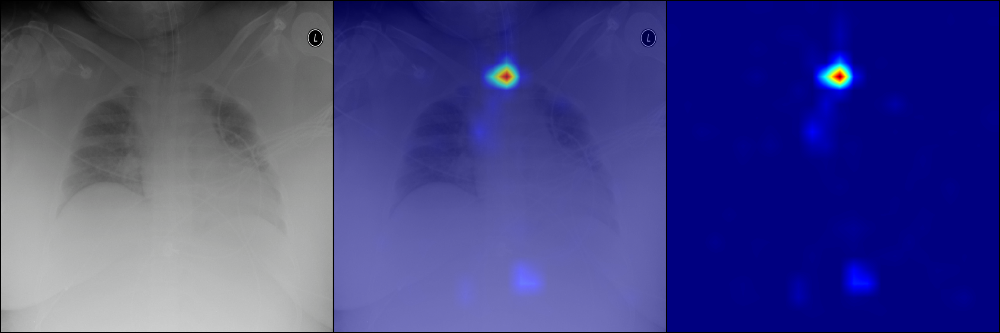

------------------------------------------------------------------------------------------------------------------------------------------------------


,ETT - Abnormal,ETT - Borderline,ETT - Normal,NGT - Abnormal,NGT - Borderline,NGT - Incompletely Imaged,NGT - Normal,CVC - Abnormal,CVC - Borderline,CVC - Normal,Swan Ganz Catheter Present
true,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.00000
pred,0.000137,0.023656,0.966089,0.000004,0.000116,0.005967,0.995962,0.003236,0.142028,0.981723,0.00009


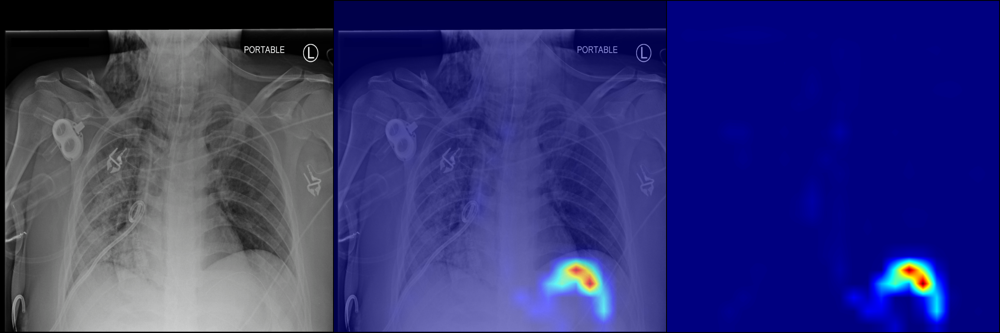

------------------------------------------------------------------------------------------------------------------------------------------------------


,ETT - Abnormal,ETT - Borderline,ETT - Normal,NGT - Abnormal,NGT - Borderline,NGT - Incompletely Imaged,NGT - Normal,CVC - Abnormal,CVC - Borderline,CVC - Normal,Swan Ganz Catheter Present
true,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.00000,0.000000,1.000000,1.000000,0.000000
pred,0.009446,0.108595,0.862641,0.001667,0.027534,0.929909,0.05507,0.012454,0.256777,0.960976,0.000533


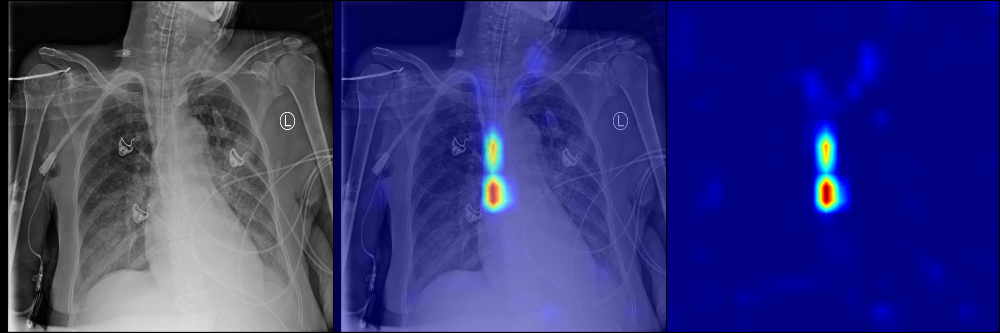

In [44]:
idx = diff[diff['rank']<=5].index
plot_gradcam(grad_cam, valid_dataloader, idx, y_true, y_pred)